In [1]:
import pi_map
mpr=pi_map.Mapper(mp=True)

reading feather...is complete


In [2]:
st=mpr.states
nhdplus=mpr.NHDPlusV21CatchmentSP

In [68]:
if True:
    import importlib
    Mapper=importlib.reload(pi_map)
    mpr=pi_map.Mapper(mp=False) #false to avoid waiting to reload nhdplus feather
    mpr.NHDPlusV21CatchmentSP=nhdplus
    mpr.states=st

In [69]:
#list(mpr.ppdt.species_hash_id_est_dict.keys())

In [70]:
spec_list=['lampetra richardsoni','etheostoma nigripinne','etheostoma rufilineatum','catostomus discobolus']

In [71]:
mpr.plotSpeciesPredict(spec_list[1],estimator_name=None,huc_level=4,include_absent=False,save_check=False,plot_train=False)

building data for etheostoma nigripinne
opening /home/dp/hdd/gits/kernelkernel/data_tool/specieshuc8files with length:4 and type:<class 'tuple'>
huc08
plotting etheostoma nigripinne...0301, 0316, 0604, 0603, 

building data for lampetra richardsoni
huc08
plotting lampetra richardsoni...0302, 1709, 1708, 1710, 1703, 1707, 1711, 1801, 1802, 1804, 1805, 1806, 1807, 

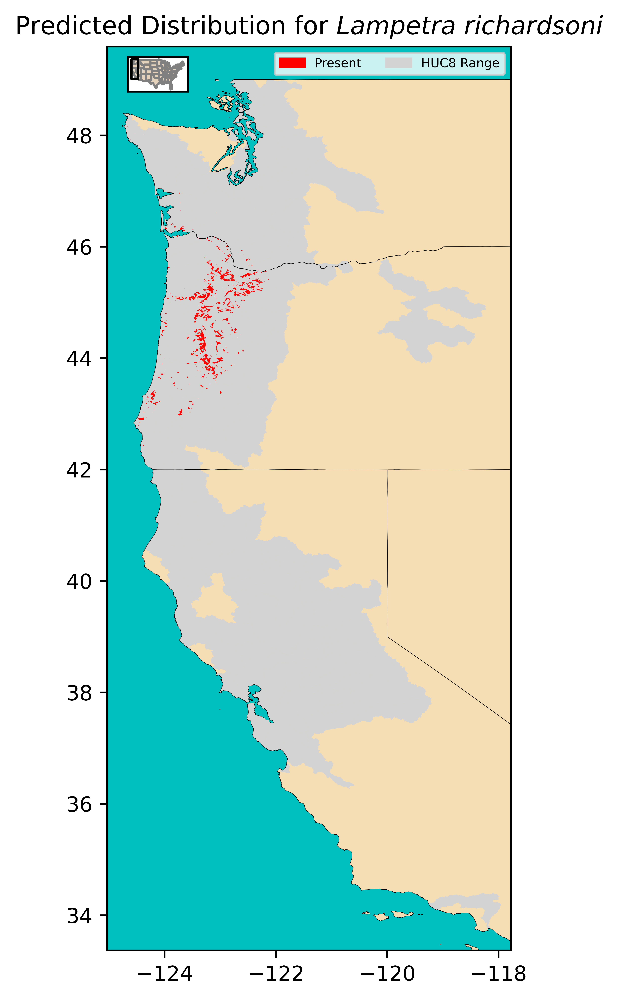

In [72]:
mpr.plotSpeciesPredict(spec_list[0],estimator_name=None,huc_level=4,include_absent=False,save_check=False,plot_train=False)

In [73]:
mpr.plotSpeciesPredict(spec_list[3],estimator_name=None,huc_level=4,include_absent=False,save_check=False,plot_train=False)

building data for catostomus discobolus
huc08
plotting catostomus discobolus...1501, 1401, 1402, 1408, 1405, 1404, 1502, 1506, 1704, 1403, 1603, 1406, 1601, 1407, 1602, 

building data for etheostoma rufilineatum
huc08
plotting etheostoma rufilineatum...0512, 0513, 0604, 0315, 0601, 0603, 0602, 0505, 0510, 

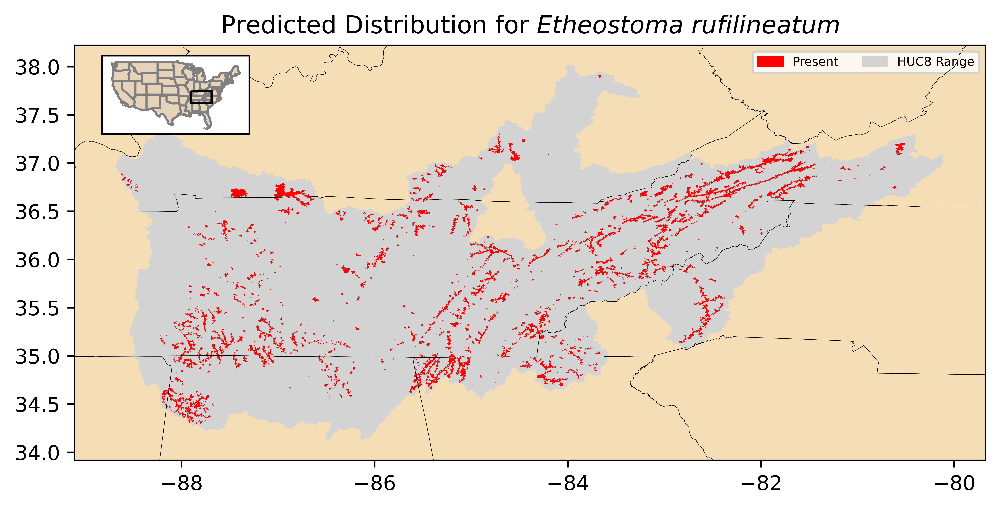

In [74]:
mpr.plotSpeciesPredict(spec_list[2],estimator_name=None,huc_level=4,include_absent=False,save_check=False,plot_train=False)

In [9]:
-

SyntaxError: invalid syntax (476313318.py, line 1)

In [ ]:
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
import matplotlib.patches as mpatches
#from matplotlib.collections import PatchCollection
#from matplotlib.patches import Polygon

In [ ]:
from pi_map import Mapper
mpr=Mapper(mp=False)

In [ ]:
mpr.set_states()

In [ ]:
crs=mpr.states.crs

In [ ]:
def findBoxRatio(box1,box2,geo='area'):
    w1=box1[2]-box1[0]
    w2=box2[2]-box2[0]
    h1=box1[3]-box1[1]
    h2=box2[3]-box2[1]
    if geo=='area':return w1*h1/(w2*h2)
    elif geo=='x':return w1**1/w2**1
    elif geo=='y': return h1**1/h2**1
    else: 
        assert False, f"findBoxRatio doesn't recognize geo:{geo}"

In [ ]:
def inset_test(size,size2=None):
    if size2 is None: size2=size
    x_min=-84.70186258
    y_min=33.56296794
    bbox=[x_min,y_min , x_min+size, y_min+size2]
    gdf_box=mpr.gdfBoxFromOuterBounds(bbox,crs)
    fig, ax = plt.subplots(figsize=[8,8],dpi=1200)
    ax.set_aspect('equal')
    gdf_box.plot(ax=ax)
    geo='x'
    states_bounds=mpr.expandBBox(mpr.states.total_bounds,1.05)
    r=findBoxRatio(bbox,states_bounds,geo=geo)
    print(r)
    inset_ax = zoomed_inset_axes(ax, .2*r, loc=2)
    inset_ax.set_xlim(states_bounds[0], states_bounds[2])
    inset_ax.set_ylim(states_bounds[1], states_bounds[3])
    mpr.states.plot(ax=inset_ax,color='tan',zorder=1,edgecolor='lightgrey')
    mpr.gdfBoxFromOuterBounds(mpr.states.total_bounds,crs).plot(ax=inset_ax,color='c',zorder=0)
    gdf_box.boundary.plot(ax=inset_ax,color='k',zorder=2,linewidth=(-np.log(r)*1.5)**.3)
    #plt.setp(inset_ax.get_xticklabels(), visible=False)
    #plt.setp(inset_ax.get_yticklabels(), visible=False)
    plt.tick_params(
        axis='both',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        left=False,
        top=False,         # ticks along the top edge are off
        labelbottom=False,
        labelleft=False
    )
    #plt.axis('off')
    leg_patches=[
        mpatches.Patch(color='red', label='Present'),
        ]
    ncols=2

    leg_patches.append(mpatches.Patch(color='lightgrey', label='HUC8 Range'))

    ax.legend(handles=leg_patches,fontsize=4,ncol=ncols)#,bbox_to_anchor=(0.1,1.1))
    plt.show()

In [ ]:
inset_test(5,10)

In [ ]:
inset_test(8,5)

In [ ]:
inset_test(7,4)

In [ ]:
-